In [103]:
import pandas as pd
import networkx as nx
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

import warnings
warnings.filterwarnings('ignore')

In [3]:
# read in data

drugs_se = pd.read_csv("data/heart_drugs_with_heart_se.csv")
drugs_target = pd.read_csv("data/heart_drugs_targets.csv")

Section 1: Drug-SE Graphs
- [ ] 1A: bipartite, all drugs - all SE
- [ ] 1B: bipartite, all drugs - top 10 most common SE
- [ ] 1C: bipartite, top 10 drugs with most SE - top 10 most common SE
- [ ] 1D: same as 1C but with node degrees labelled
- [ ] 1E: projected SE - SE graph, shows which SEs occur together most often

Section 2: Drug-Target Graphs (A-F only matching on target, G+ matching on target and action)
- [ ] 2A: bipartite, all drugs - all targets
- [ ] 2B: projected drug - drug graph, shows which drugs are the most similar based on their targets
- [ ] 2C: bipartite, top 10 drugs with most SE - all targets
- [ ] 2D: projected drug - drug graph, shows which drugs are the most similar based on their targets
- [ ] 2E: bipartite, top 20 drugs with most SE - all targets
- [ ] 2F: projected drug - drug graph, shows which drugs are most similar based on their targets
- [ ] 2G: bipartite, all drugs - targets with only top 10 most common actions
- [ ] 2H: projected drug - drug graph, shows which drugs are most similar based on their targets and actions
- [ ] 2I: bipartite, all drugs - targets with only top 10 most common actions AND at least 5 edges
- [ ] 2J: projected drug - drug graph, shows which drugs are most similar based on their targets and actions (SHOWS 5 CLUSTERS)
- [ ] 2k: countplot of common side effects by group on same graph
- [ ] 2L shows frequency of side effects by group in 5 subplots

# Drug-SE Graphs

### TODO: label by color what year drugs were approved

In [4]:
# format edges

drugs_se['edge'] = [(drugs_se['drug_name'][e], drugs_se['side_effect_name'][e]) for e in range(len(drugs_se))]

In [5]:
# function to draw drug - se graph based on df with drug_name, side_effect_name, and edges

def draw_bipartite_graph(df, title=""):
    G = nx.Graph()
    
    # add bipartite nodes
    drugs = df[list(df)[0]].unique()
    se = df[list(df)[1]].unique()
    edges = df['edge']
    
    G.add_nodes_from(drugs, bipartite=0)
    G.add_nodes_from(se, bipartite=1)
    
    # add edges
    G.add_edges_from(edges)
    
    # create color_dict
    color_dict = {}
    for d in range(len(drugs)):
        color_dict[drugs[d]] = sns.color_palette("hls", len(drugs))[d]
    
    # set colors
    edge_colors = []
    for pair in G.edges:
        edge_colors.append(color_dict[pair[0]])
    
#     # sanity check
#     assert nx.is_connected(G)
    
    # plot graph
    bottom_nodes, top_nodes = drugs, se
    
    top = bottom_nodes
    pos = nx.bipartite_layout(G, top)
    
    plt.figure(figsize=(10, 10)) 
    plt.title(title)
    nx.draw(G, pos=pos, with_labels=True, edge_color=edge_colors)
    return G

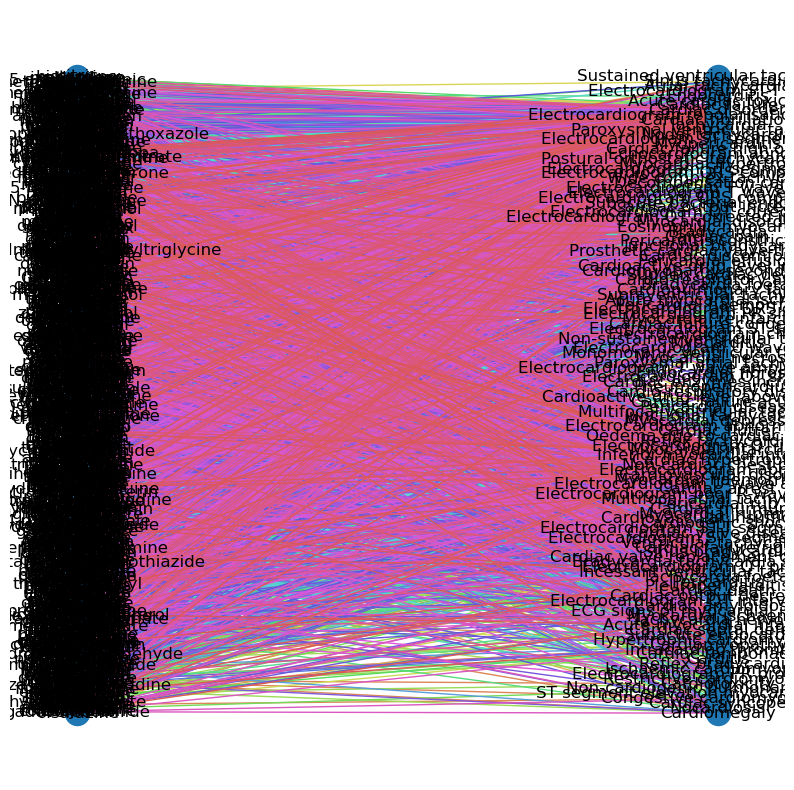

In [6]:
# 1A
drugs_se_G = draw_bipartite_graph(drugs_se)

## Trying again but with a smaller number of ADEs

In [7]:
# current number of side effects

len(drugs_se.side_effect_name.unique())

132

In [8]:
# 10 most common heart side effects

Counter(drugs_se.side_effect_name).most_common(10)

[('Tachycardia', 577),
 ('Cardiac disorder', 411),
 ('Bradycardia', 356),
 ('Myocardial infarction', 321),
 ('Cardiac arrest', 230),
 ('Cardiac failure', 216),
 ('Cardiac failure congestive', 197),
 ('Ventricular tachycardia', 141),
 ('Cardiovascular disorder', 120),
 ('Myocardial ischaemia', 117)]

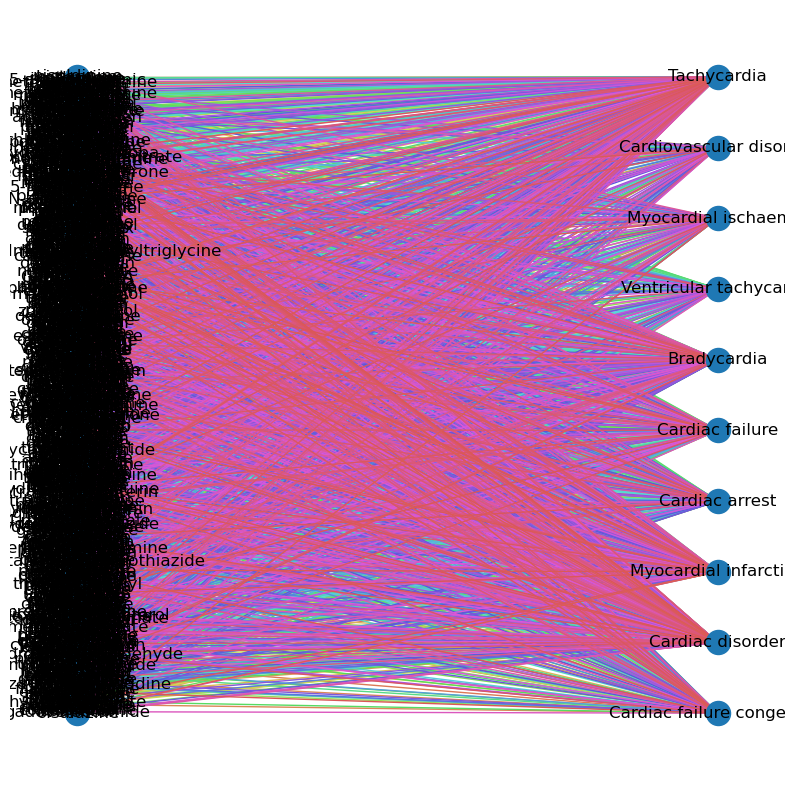

In [9]:
# 1B
# most common keys

top_ten_common_se = [k[0] for k in Counter(drugs_se.side_effect_name).most_common(10)]
top_ten_common_drugs_se = drugs_se[drugs_se['side_effect_name'].isin(top_ten_common_se)]

draw_bipartite_graph(top_ten_common_drugs_se)

## Trying again but with a smaller number of ADEs (10) and smaller number of drugs (10)

In [10]:
# 20 drugs with most heart side effects

Counter(drugs_se.drug_name).most_common(20)

[('tacrolimus', 24),
 ('aripiprazole', 24),
 ('pregabalin', 23),
 ('cyclophosphamide', 22),
 ('risperidone', 21),
 ('bortezomib', 21),
 ('doxorubicin', 20),
 ('ifosfamide', 19),
 ('mycophenolate', 18),
 ('anthracycline', 17),
 ('memantine', 17),
 ('propafenone', 17),
 ('citalopram', 16),
 ('dasatinib', 16),
 ('clomipramine', 15),
 ('ioversol', 15),
 ('quetiapine', 15),
 ('dipyridamole', 14),
 ('fluvoxamine', 14),
 ('iopamidol', 14)]

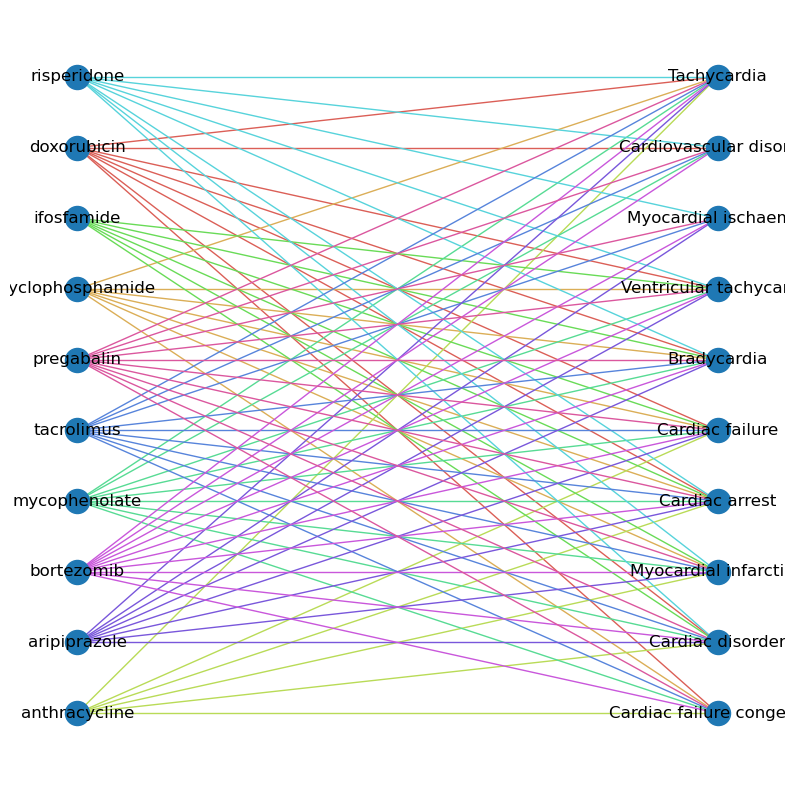

In [11]:
# 1C

# most common keys

top_ten_drugs = [k[0] for k in Counter(drugs_se.drug_name).most_common(10)]

top_ten_drugs_top_ten_se = top_ten_common_drugs_se[top_ten_common_drugs_se['drug_name'].isin(top_ten_drugs)]

top_10 = draw_bipartite_graph(top_ten_drugs_top_ten_se)

In [12]:
# function to label with node degree

def label_node_deg(G, title=""):
    for node in G.nodes():
        d = G.degree(node)
        mapping = {node: node + ' \n ' + str(d)}
        G = nx.relabel_nodes(G, mapping)
    
    drugs = list(nx.bipartite.sets(G)[0])
        
    # create color_dict
    color_dict = {}
    for d in range(len(drugs)):
        color_dict[drugs[d]] = sns.color_palette("hls", len(drugs))[d]
    
    # set colors
    edge_colors = []
    for pair in G.edges:
        edge_colors.append(color_dict[pair[0]])
        
    # plot graph
    bottom_nodes, top_nodes = nx.bipartite.sets(G)
    
    top = nx.bipartite.sets(G)[0]
    pos = nx.bipartite_layout(G, top)
    
    plt.figure(figsize=(10, 10)) 
    plt.title(title)    
    nx.draw(G, pos=pos, with_labels=True, edge_color=edge_colors, font_size=9)
    return G

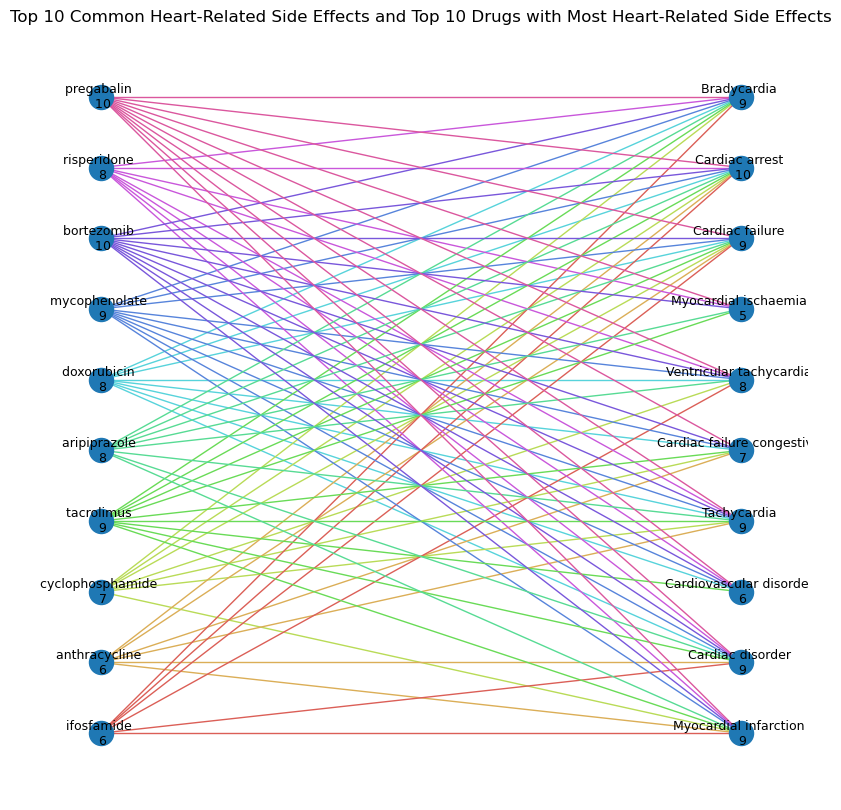

In [13]:
# 1D
label_node_deg(top_10, "Top 10 Common Heart-Related Side Effects and Top 10 Drugs with Most Heart-Related Side Effects")


In [14]:
# function to project drug - target network to drug - drug network

def project_drug_target(G, drugs, with_labels=True):
    projected = nx.bipartite.weighted_projected_graph(G, drugs)
    
    pos=nx.nx_agraph.graphviz_layout(projected)
    
    # draw projected drug-drug graphs
    nx.draw(projected, with_labels=with_labels, pos=pos, font_size=9)

    # add weights between drugs
    labels = nx.get_edge_attributes(projected, 'weight')
    nx.draw_networkx_edge_labels(projected, pos=pos, edge_labels=labels, font_size=6);
    
    return projected

### Looking at SE - SE graphs to sanity check which side effects are the most related 

In [15]:
drugs_se

,drug_name,side_effect_name,edge
0,carnitine,Cardiovascular disorder,"(carnitine, Cardiovascular disorder)"
1,carnitine,Tachycardia,"(carnitine, Tachycardia)"
2,carnitine,Electrocardiogram abnormal,"(carnitine, Electrocardiogram abnormal)"
3,5-aminolevulinic,Cardiac disorder,"(5-aminolevulinic, Cardiac disorder)"
4,PGE2,Cardiac arrest,"(PGE2, Cardiac arrest)"
...,...,...,...
3926,K779,Pericardial effusion,"(K779, Pericardial effusion)"
3927,K779,Tachycardia,"(K779, Tachycardia)"
3928,K779,Myocardial ischaemia,"(K779, Myocardial ischaemia)"
3929,K779,Bradycardia,"(K779, Bradycardia)"


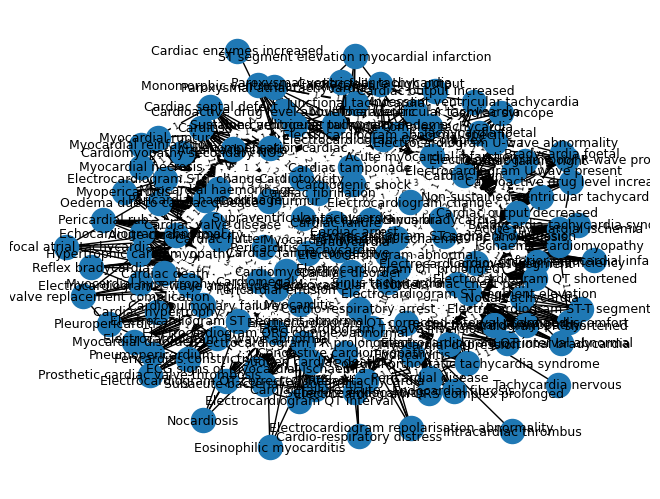

In [16]:
# 1E
dse_projected = project_drug_target(drugs_se_G, drugs_se.side_effect_name.unique())

In [17]:
# create dataframe of projection

sides = []
weight = []

for edge in dse_projected.edges(data=True):
    sides.append((edge[0], edge[1]))
    weight.append(edge[2]['weight'])
    
dse_proj_df = pd.DataFrame({"sides": sides, "weight": weight})

In [18]:
# most commonly occurring side effects

dse_proj_df.sort_values('weight', ascending=False).head(10)

,sides,weight
186,"(Tachycardia, Cardiac disorder)",276
144,"(Tachycardia, Bradycardia)",264
187,"(Tachycardia, Myocardial infarction)",224
337,"(Cardiac disorder, Bradycardia)",183
175,"(Tachycardia, Cardiac arrest)",182
377,"(Cardiac disorder, Myocardial infarction)",165
446,"(Cardiac arrest, Bradycardia)",162
556,"(Myocardial infarction, Bradycardia)",157
189,"(Tachycardia, Cardiac failure)",156
109,"(Tachycardia, Cardiac failure congestive)",139


# Drug - Drug Graphs

In [19]:
# create drug - target network first then project into a drug - drug network

dt = drugs_target[['drug_name', 'target_name']]

dt['edge'] = [(dt['drug_name'][e], dt['target_name'][e]) for e in range(len(dt))]

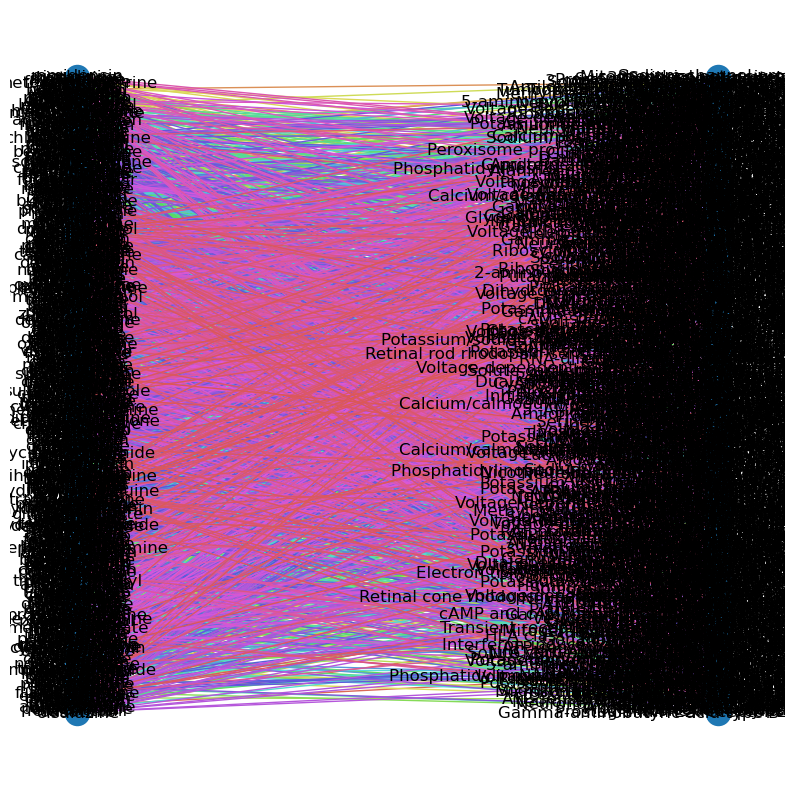

In [20]:
# 2A
top_dt = draw_bipartite_graph(dt)

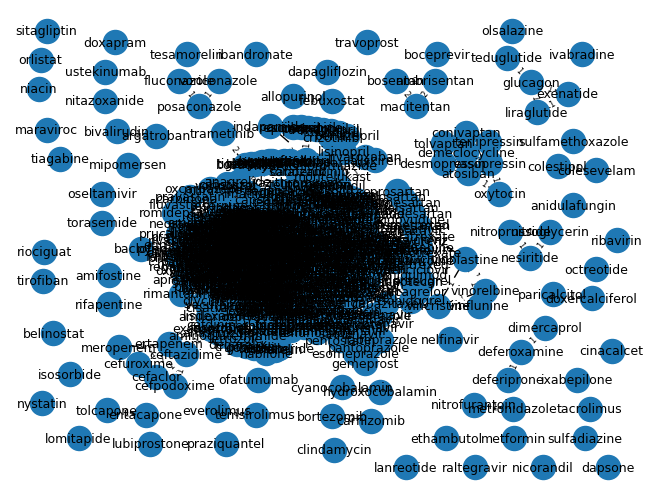

In [21]:
# 2B
project_drug_target(top_dt, dt.drug_name.unique())

In [22]:
# total number of drug - target pairs

print("Total number of drug-target pairs: " + str(len(dt)))

# number of unique drugs in graph

print("Total number of unique drugs in graph: " + str(len(dt.drug_name.unique())))

Total number of drug-target pairs: 6713
Total number of unique drugs in graph: 664


## Trying again but with a smaller number of drugs (10)

In [23]:
# top 10 drugs with the most se

top_ten_drugs

['tacrolimus',
 'aripiprazole',
 'pregabalin',
 'cyclophosphamide',
 'risperidone',
 'bortezomib',
 'doxorubicin',
 'ifosfamide',
 'mycophenolate',
 'anthracycline']

In [24]:
top_10_drugs_dt = dt[dt['drug_name'].isin(top_ten_drugs)]

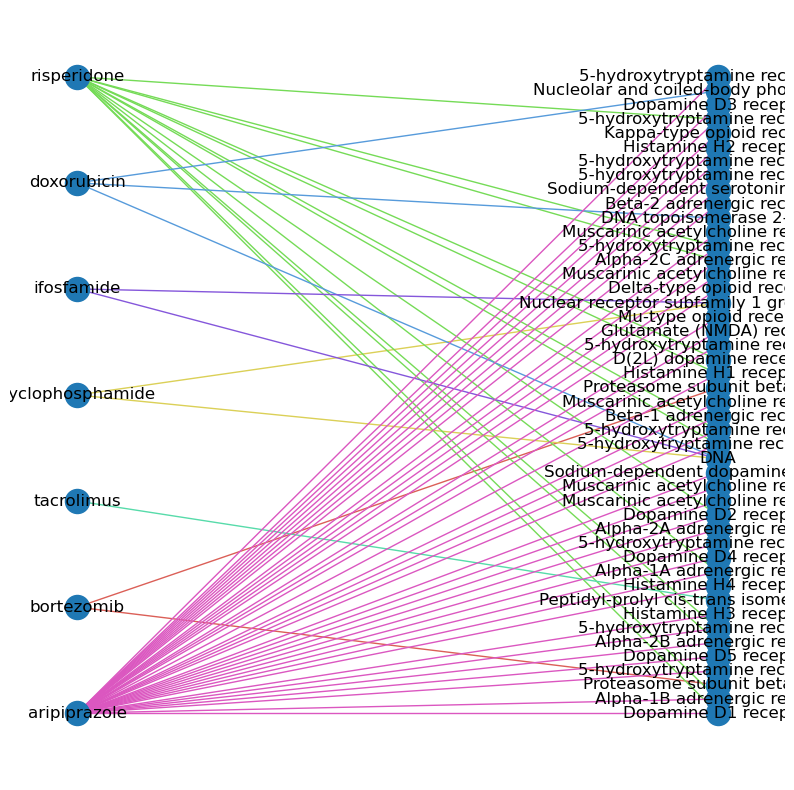

In [25]:
# 2C
top_10_dt = draw_bipartite_graph(top_10_drugs_dt)

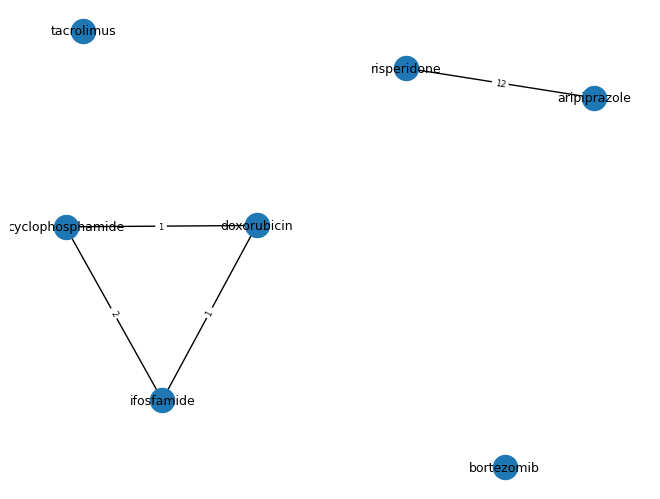

In [26]:
# 2D
# project from drug - target network to drug - drug network

project_drug_target(top_10_dt, top_10_drugs_dt.drug_name.unique())

## Trying again but with a slightly larger number of drugs (20)

In [27]:
# 2E
# top 20 drugs with the most se

top_twenty_drugs = [k[0] for k in Counter(drugs_se.drug_name).most_common(20)]
top_20_drugs_dt = dt[dt['drug_name'].isin(top_twenty_drugs)]

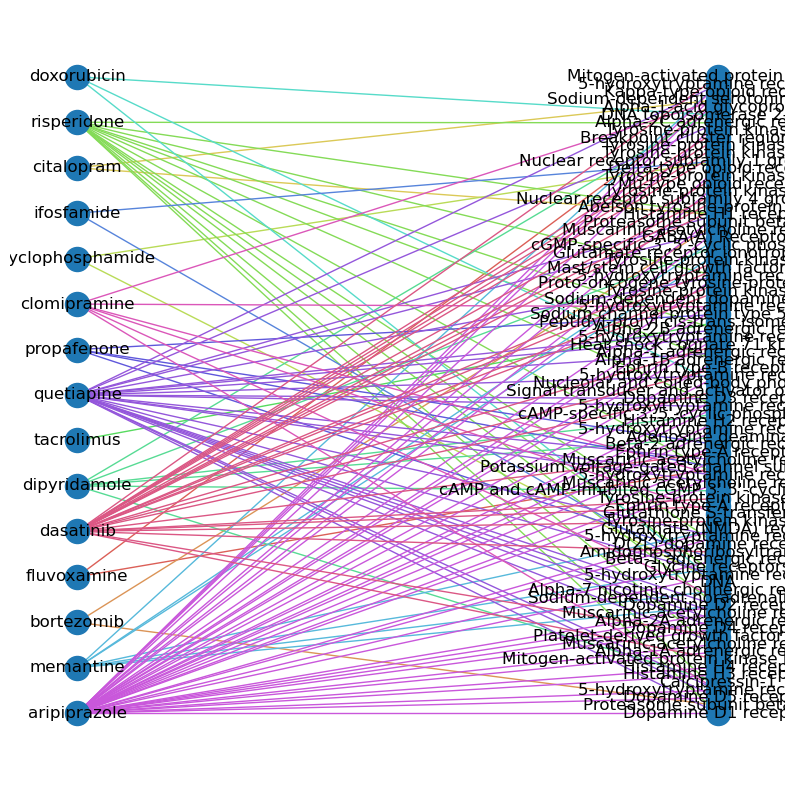

In [28]:
top_20_dt = draw_bipartite_graph(top_20_drugs_dt)

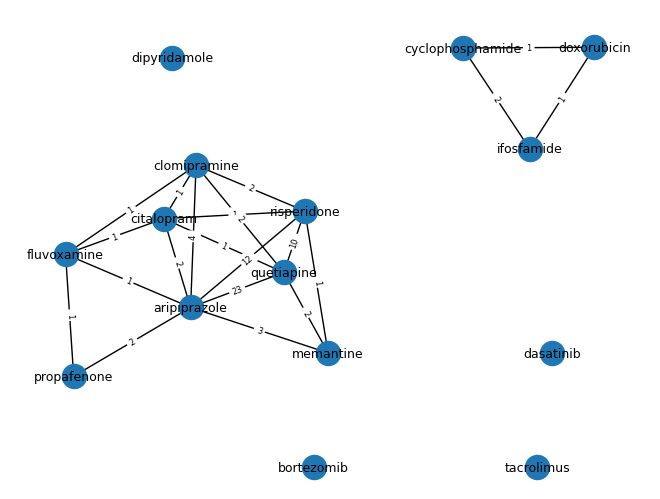

In [29]:
# 2F
project_drug_target(top_20_dt, top_20_drugs_dt.drug_name.unique())

### Network with top 10 common actions and matching on target AND action

In [30]:
# most common actions

top_targets = Counter(drugs_target.action).most_common(10)
t = [t[0] for t in top_targets]

In [31]:
# create column that contains target and action to match drugs on

dt_action = drugs_target[['drug_name', 'target_name', 'action']]
dt_action['target'] = [dt_action['target_name'][d] + " " + dt_action['action'][d] for d in range(len(dt_action))]
dt_action_top = dt_action[dt_action["action"].isin(t)]


In [32]:
# format df 

dt_action_top.reset_index(inplace=True)
dt_action_top['edge'] = [(dt_action_top['drug_name'][e], \
                          dt_action_top['target'][e]) for e in range(len(dt_action_top))]
dt_action_top = dt_action_top.drop('index', axis=1)
dt_action_top = dt_action_top.drop('action', axis=1)
dt_action_top = dt_action_top.drop('target_name', axis=1)

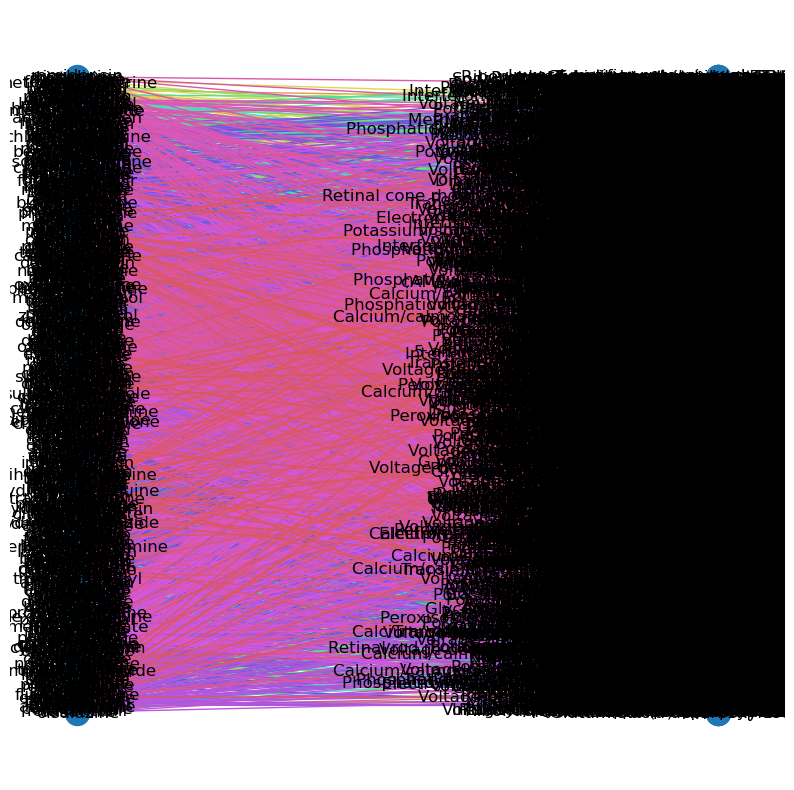

In [33]:
# 2G
# matching on all drugs and all targets but only with top 10 most common actions
top_dt = draw_bipartite_graph(dt_action_top)

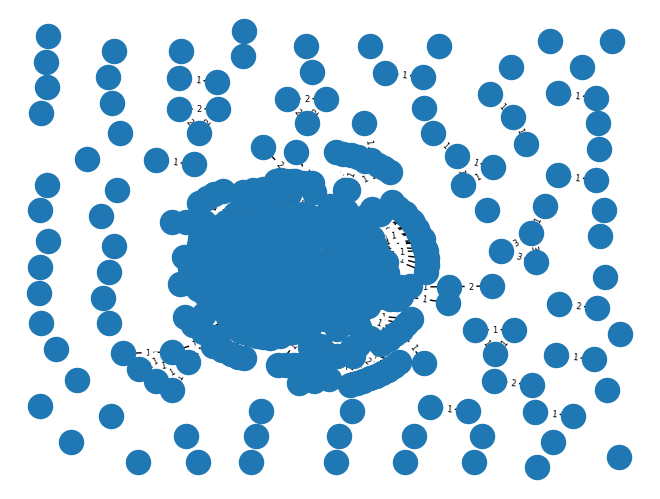

In [34]:
# 2H
# project to drug - drug network

project_drug_target(top_dt, dt_action_top.drug_name.unique(), False)

### Trying again with only targets that have at least 5 drugs associated with them (should remove the singular nodes on the edges)

In [35]:
# get new df

dt_grouped = dt_action_top.groupby('target', as_index=False).agg({"edge": len})
common_targets = dt_grouped[dt_grouped["edge"]>5]['target']

dt_common_targets = dt_action_top[dt_action_top['target'].isin(common_targets)][["drug_name", "target", "edge"]]

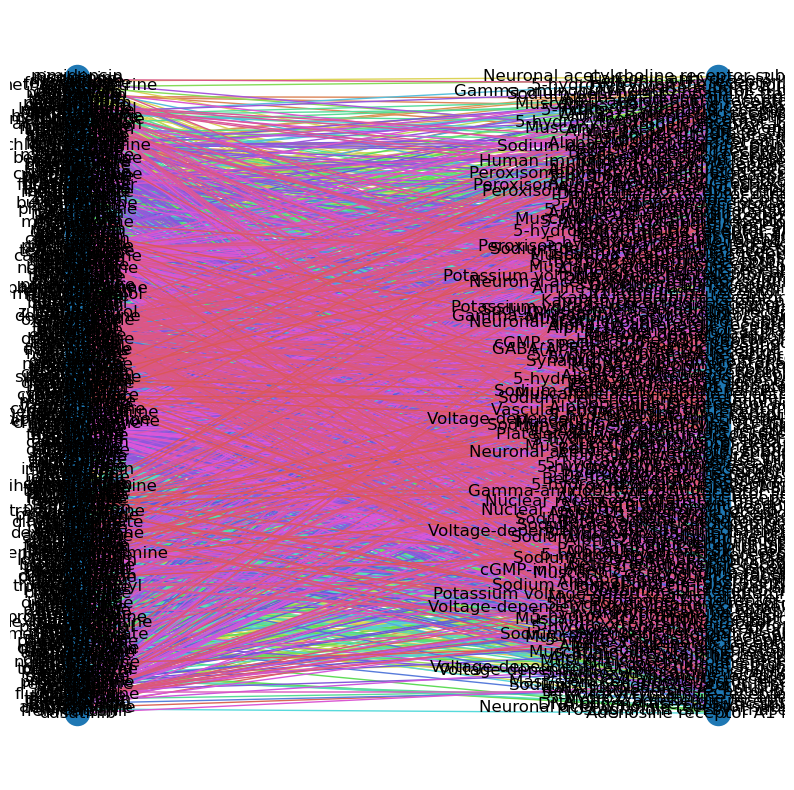

In [36]:
# 2I
common_targets_dt = draw_bipartite_graph(dt_common_targets)

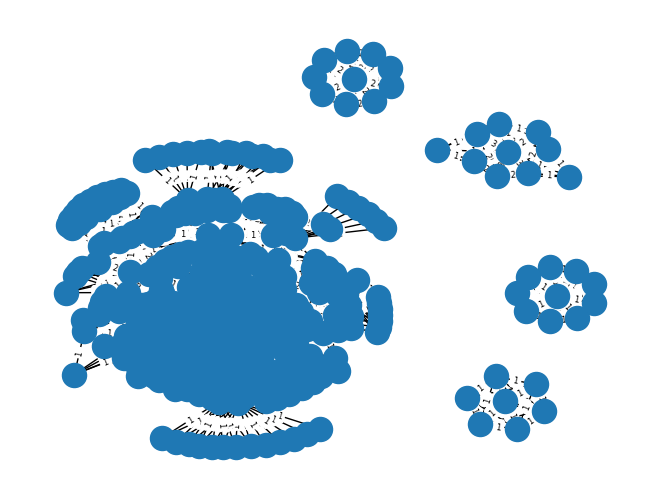

In [37]:
# 2J
# project to drug-drug network
pg = project_drug_target(common_targets_dt, dt_common_targets.drug_name.unique(), False)

In [38]:
# num connected components (groups we have found by target connections)
len(list(nx.connected_components(common_targets_dt)))

5

## looking at percent ADEs per group

In [39]:
# label points by which cluster they are in

drug_cluster = {}

for i, target_set in enumerate(nx.connected_components(pg)):
    drug_cluster[i] = list(target_set)
    
def return_class(drug):
    for i in range(5):
        if drug in drug_cluster[i]:
            return i
        
dt_common_targets['group'] = [return_class (t) for t in dt_common_targets.drug_name]
percent_ade_df = pd.merge(dt_common_targets[['drug_name', 'group']], drugs_se[['drug_name', 'side_effect_name']], on='drug_name', how='left')

In [40]:
# get most common 5 side effects for each group

pdf = percent_ade_df.groupby(["group", "side_effect_name"], as_index=False).agg({"drug_name": len}).sort_values(['drug_name'], ascending=False)

side_effects = []

for g in range(5):
    for se in pdf[pdf["group"] == g].head(5)['side_effect_name']:
        if se not in side_effects:
            side_effects.append(se)
    
mini = percent_ade_df[percent_ade_df["side_effect_name"].isin(side_effects)]

<AxesSubplot: xlabel='count', ylabel='side_effect_name'>

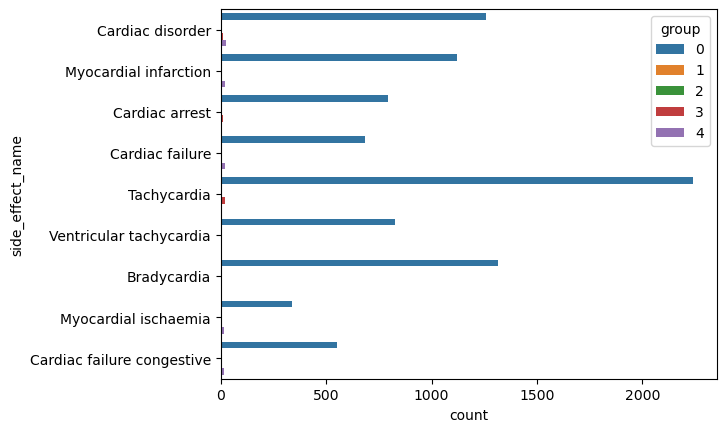

In [41]:
# 2K

sns.countplot(data=percent_ade_df[percent_ade_df["side_effect_name"].isin(side_effects)], y='side_effect_name', hue='group')

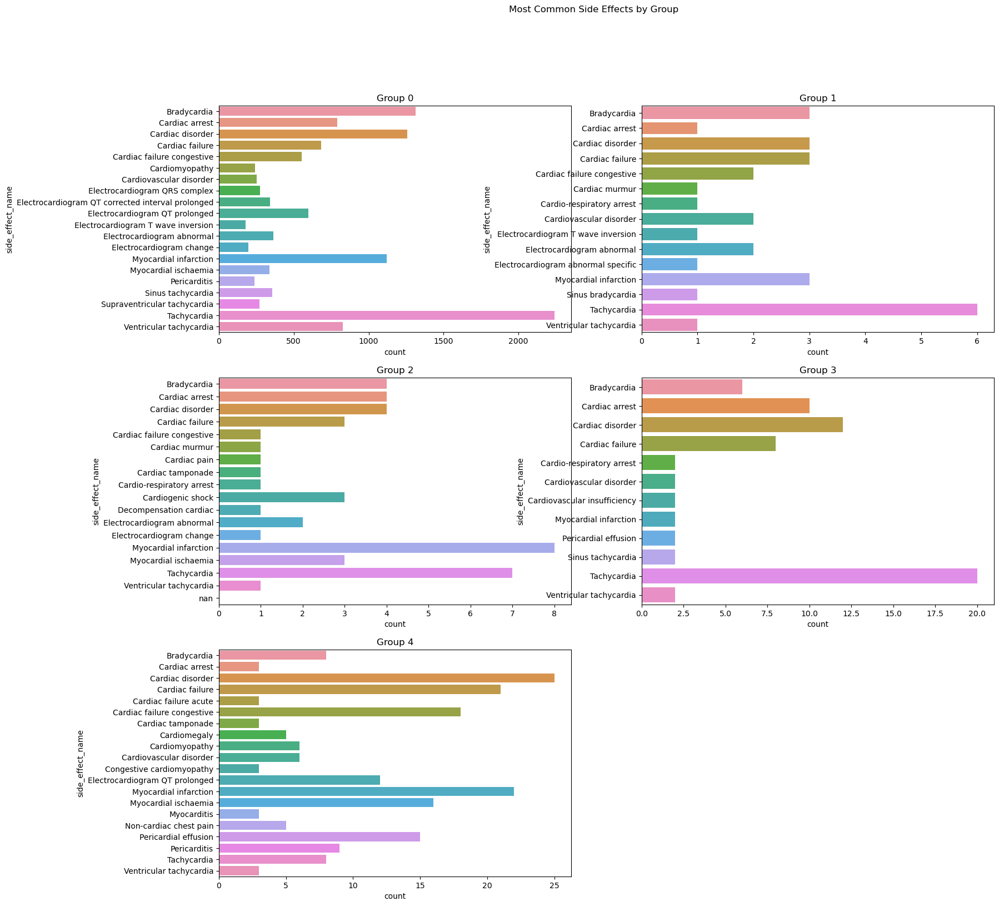

In [42]:
# 2L
# plot frequencies of 20 most common ADEs for each group
mc = 20

fig, axes = plt.subplots(3, 2, figsize=(18, 18))
axes[2][1].set_visible(False)
fig.suptitle('Most Common Side Effects by Group')

for group in range(5):
    s = percent_ade_df[percent_ade_df["group"] == group]
    s_count = [i[0] for i in Counter(s.side_effect_name).most_common(mc)]
    order = sorted(s_count, key=lambda e: (type(e) is float, e))
    top_s_se = s[s['side_effect_name'].isin(s_count)]

    sns.countplot(ax = axes[group//2, group%2], data=top_s_se, y='side_effect_name', order=order).set(title='Group ' + str(group));

## Classifier

Predict ADEs bsed on how close it is to all other nodes in specific cluster

In [49]:
dt_common_targets.groupby('group').agg({"edge": len})

,edge
group,
0,2668
1,7
2,10
3,20
4,26


Looking at the above counts, we have decided to make a classifier with only members of group 0 because the other ones have so few edges. 

In [64]:
# cluster 0

g0 = dt_common_targets[dt_common_targets["group"] == 0]
g0_drugs = g0.drug_name.unique()

In [ ]:
a = []
b = []

for drug_group in g0.groupby("target", as_index=False).agg({"drug_name": list})['drug_name']:
    for pair in list(combinations(drug_group, 2)):
        a.append(pair[0])
        b.append(pair[1])
        
drug_drug_df = pd.DataFrame({"drug_name": a, "target": b})

In [113]:
final_edges = drugs_se[drugs_se["drug_name"].isin(g0_drugs)][["drug_name", "side_effect_name"]]
final_edges.columns = ["drug_name", "target"]

final_df = pd.concat([final_edges, drug_drug_df], 0)



In [114]:
final_df

,drug_name,target
44,bupropion,Cardiovascular disorder
45,bupropion,Cardiac flutter
46,bupropion,Cardiac disorder
47,bupropion,Myocardial infarction
48,bupropion,Tachycardia
...,...,...
23194,tadalafil,dipyridamole
23195,tadalafil,avanafil
23196,vardenafil,dipyridamole
23197,vardenafil,avanafil


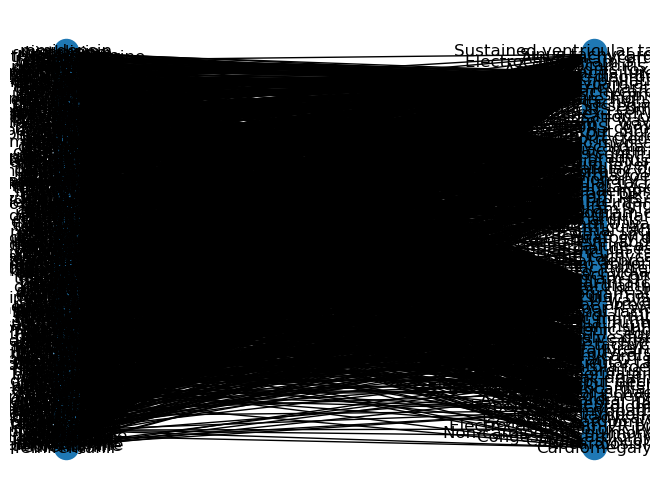

In [115]:
# create final network

final_G = nx.from_pandas_edgelist(final_df, 'drug_name', 'target')
positions = nx.bipartite_layout(final_G, g0.drug_name.unique())
nx.draw(final_G, positions, with_labels=True)

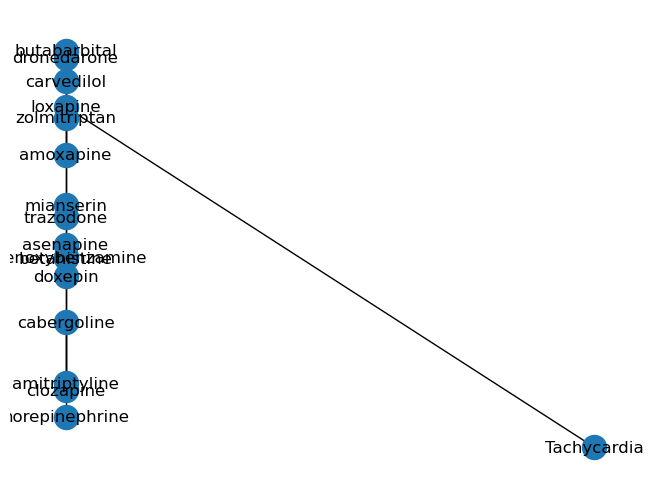

In [117]:
# create final network

final_G = nx.from_pandas_edgelist(final_df.sample(10), 'drug_name', 'target')
positions = nx.bipartite_layout(final_G, g0.drug_name.unique())
nx.draw(final_G, positions, with_labels=True)

In [100]:
final_df

,drug_name,target
44,bupropion,Cardiovascular disorder
45,bupropion,Cardiac flutter
46,bupropion,Cardiac disorder
47,bupropion,Myocardial infarction
48,bupropion,Tachycardia
...,...,...
5876,homatropine,Muscarinic acetylcholine receptor M2 antagonist
5877,homatropine,Muscarinic acetylcholine receptor M3 antagonist
5878,homatropine,Muscarinic acetylcholine receptor M4 antagonist
5879,homatropine,Muscarinic acetylcholine receptor M5 antagonist


In [60]:
# get drug - drug links

g0.groupby("target", as_index=False).agg({"drug_name": list})

,target,drug_name
0,5-hydroxytryptamine receptor 1A agonist,"[eletriptan, ziprasidone, methysergide, caberg..."
1,5-hydroxytryptamine receptor 1A antagonist,"[ziprasidone, methysergide, cabergoline, amitr..."
2,5-hydroxytryptamine receptor 1A binder,"[methysergide, cabergoline, amitriptyline, lox..."
3,5-hydroxytryptamine receptor 1A inhibitor,"[amitriptyline, methylphenidate, imipramine, c..."
4,5-hydroxytryptamine receptor 1A other/unknown,"[haloperidol, propranolol, lisuride, trimipram..."
...,...,...
198,Voltage-dependent L-type calcium channel subun...,"[isradipine, nimodipine, nisoldipine, felodipi..."
199,Voltage-dependent L-type calcium channel subun...,"[isradipine, nimodipine, nisoldipine, nicardip..."
200,Voltage-dependent calcium channel subunit alph...,"[isradipine, ibutilide, nisoldipine, nicardipi..."
201,"cGMP-inhibited 3',5'-cyclic phosphodiesterase ...","[milrinone, anagrelide, theophylline, levosime..."


In [56]:
dt.head()

,drug_name,target_name,edge
0,bivalirudin,Prothrombin,"(bivalirudin, Prothrombin)"
1,goserelin,Lutropin-choriogonadotropic hormone receptor,"(goserelin, Lutropin-choriogonadotropic hormon..."
2,goserelin,Gonadotropin-releasing hormone receptor,"(goserelin, Gonadotropin-releasing hormone rec..."
3,desmopressin,Vasopressin V2 receptor,"(desmopressin, Vasopressin V2 receptor)"
4,desmopressin,Vasopressin V1a receptor,"(desmopressin, Vasopressin V1a receptor)"


drug - ade network
- edges between two drugs if they had at least 1 common target protein
- edges between drug and ade if thre is at least 1 article published before a certain year mentioning the association

In [51]:
dt_common_targets

,drug_name,target,edge,group
97,pravastatin,Histone deacetylase 2 inhibitor,"(pravastatin, Histone deacetylase 2 inhibitor)",0
98,fluvoxamine,Sodium-dependent serotonin transporter inhibitor,"(fluvoxamine, Sodium-dependent serotonin trans...",0
99,fluvoxamine,Potassium voltage-gated channel subfamily H me...,"(fluvoxamine, Potassium voltage-gated channel ...",0
100,valsartan,Type-1 angiotensin II receptor antagonist,"(valsartan, Type-1 angiotensin II receptor ant...",1
101,ramipril,Angiotensin-converting enzyme inhibitor,"(ramipril, Angiotensin-converting enzyme inhib...",2
...,...,...,...,...
5879,homatropine,Muscarinic acetylcholine receptor M5 antagonist,"(homatropine, Muscarinic acetylcholine recepto...",0
5881,tropisetron,5-hydroxytryptamine receptor 3A antagonist,"(tropisetron, 5-hydroxytryptamine receptor 3A ...",0
5882,lormetazepam,GABA(A) Receptor ligand,"(lormetazepam, GABA(A) Receptor ligand)",3
5883,lormetazepam,GABA(A) Receptor Benzodiazepine Binding Site l...,"(lormetazepam, GABA(A) Receptor Benzodiazepine...",3


In [247]:
# scraping to get list of drugs and targets we need dates for

In [252]:
dt_common_targets['target_name'] = dt_common_targets['target'].apply(lambda x: " ".join(x.split(" ")[0:-1]))

In [256]:
dt_common_targets[['drug_name', 'target']].to_csv('drug_target_searches.csv', index=False)

In [118]:
dt_common_targets

,drug_name,target,edge,group
97,pravastatin,Histone deacetylase 2 inhibitor,"(pravastatin, Histone deacetylase 2 inhibitor)",0
98,fluvoxamine,Sodium-dependent serotonin transporter inhibitor,"(fluvoxamine, Sodium-dependent serotonin trans...",0
99,fluvoxamine,Potassium voltage-gated channel subfamily H me...,"(fluvoxamine, Potassium voltage-gated channel ...",0
100,valsartan,Type-1 angiotensin II receptor antagonist,"(valsartan, Type-1 angiotensin II receptor ant...",1
101,ramipril,Angiotensin-converting enzyme inhibitor,"(ramipril, Angiotensin-converting enzyme inhib...",2
...,...,...,...,...
5879,homatropine,Muscarinic acetylcholine receptor M5 antagonist,"(homatropine, Muscarinic acetylcholine recepto...",0
5881,tropisetron,5-hydroxytryptamine receptor 3A antagonist,"(tropisetron, 5-hydroxytryptamine receptor 3A ...",0
5882,lormetazepam,GABA(A) Receptor ligand,"(lormetazepam, GABA(A) Receptor ligand)",3
5883,lormetazepam,GABA(A) Receptor Benzodiazepine Binding Site l...,"(lormetazepam, GABA(A) Receptor Benzodiazepine...",3
